## Анализ топологии жанров и популярности через MIR-признаки

Сравнение top50 (популярных) и 1000musicSpotify треков через UMAP + кластеризацию (HDBSCAN, OPTICS)

**Графики:**
1. Общий UMAP всех жанров (цвет по жанрам)
2. Общий UMAP с кластерами HDBSCAN
3. Общий UMAP с кластерами OPTICS
4. UMAP с выделением Top50 по жанрам
5. Для каждого жанра: Top50 vs Spotify1000, HDBSCAN, OPTICS


In [5]:
import os
import sys
import glob
from pathlib import Path
from tqdm import tqdm
import warnings
warnings.filterwarnings('ignore')

# Определение корня проекта
try:
    from IPython import get_ipython
    ipython = get_ipython()
    if ipython is not None:
        notebook_name = ipython.user_ns.get('__vsc_ipynb_file__') or ipython.user_ns.get('__file__')
        if notebook_name:
            notebook_path = Path(notebook_name).resolve()
            if 'notebooks' in str(notebook_path):
                project_root = notebook_path.parent.parent
            else:
                project_root = notebook_path.parent
        else:
            cwd = Path.cwd().resolve()
            if (cwd / 'notebooks').exists() and (cwd / 'src').exists():
                project_root = cwd
            elif 'notebooks' in str(cwd):
                project_root = cwd.parent
            else:
                project_root = cwd
    else:
        raise AttributeError("Not in IPython")
except:
    cwd = Path.cwd().resolve()
    if (cwd / 'notebooks').exists() and (cwd / 'src').exists():
        project_root = cwd
    elif 'notebooks' in str(cwd):
        project_root = cwd.parent
    else:
        current = cwd
        while current != current.parent:
            if (current / 'notebooks').exists() and (current / 'src').exists():
                project_root = current
                break
            current = current.parent
        else:
            project_root = cwd

sys.path.insert(0, str(project_root))
sys.path.insert(0, str(project_root / 'src'))

print(f"✓ Корень проекта: {project_root}")

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D

from src.mir_bar_features import mir_bar_embeddings
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import OPTICS
import hdbscan
import umap

plt.rcParams.update({'font.size': 11})
plt.rcParams['figure.dpi'] = 120


✓ Корень проекта: /Users/mverzhbitskiy/Documents/GitHub/3rdCourseWork


In [6]:
# ========== КОНФИГУРАЦИЯ ==========

# Пути к данным
TOP50_DIR = project_root / "data/top50musicSpotify"
SPOTIFY1000_DIR = project_root / "data/1000songstry1"

# Жанры (общие для обоих датасетов)
GENRES = ['blues', 'classical', 'country', 'electronic', 'hip-hop', 
          'jazz', 'metal', 'pop', 'reggae', 'rock']

# MIR-параметры
MIR_KWARGS = dict(
    beats_per_bar=4,
    use_auto_tempo=True,
    bpm=None,
)

# UMAP параметры
UMAP_PARAMS = dict(
    n_components=2,
    n_neighbors=30,
    min_dist=0.3,
    metric='euclidean',
    random_state=42,
)

# HDBSCAN параметры
HDBSCAN_PARAMS = dict(
    min_cluster_size=50,
    min_samples=10,
)

# OPTICS параметры
OPTICS_PARAMS = dict(
    min_samples=10,
    xi=0.05,
    min_cluster_size=0.02,
)

# Цвета для жанров
GENRE_COLORS = {
    'blues': '#1f77b4',
    'classical': '#ff7f0e', 
    'country': '#2ca02c',
    'electronic': '#d62728',
    'hip-hop': '#9467bd',
    'jazz': '#8c564b',
    'metal': '#e377c2',
    'pop': '#7f7f7f',
    'reggae': '#bcbd22',
    'rock': '#17becf',
}

print("✓ Конфигурация загружена")
print(f"  Top50: {TOP50_DIR}")
print(f"  1000music: {SPOTIFY1000_DIR}")


✓ Конфигурация загружена
  Top50: /Users/mverzhbitskiy/Documents/GitHub/3rdCourseWork/data/top50musicSpotify
  1000music: /Users/mverzhbitskiy/Documents/GitHub/3rdCourseWork/data/1000songstry1


## 1. Загрузка и обработка данных


In [7]:
def load_genre_embeddings(genre_dir: Path, source_label: str):
    """
    Загружает MIR-эмбеддинги для всех треков в папке жанра.
    
    Returns:
        embeddings: np.array - эмбеддинги баров
        metadata: list of dict - метаданные для каждого бара
    """
    audio_files = []
    audio_files.extend(glob.glob(str(genre_dir / "*.wav")))
    audio_files.extend(glob.glob(str(genre_dir / "*.mp3")))
    
    if not audio_files:
        return np.array([]), []
    
    all_embeddings = []
    all_metadata = []
    
    for fpath in audio_files:
        try:
            bars = mir_bar_embeddings(file_path=fpath, **MIR_KWARGS)
            if bars.size == 0:
                continue
            all_embeddings.append(bars)
            
            # Метаданные для каждого бара
            for _ in range(bars.shape[0]):
                all_metadata.append({
                    'source': source_label,
                    'genre': genre_dir.name,
                    'file': os.path.basename(fpath),
                })
        except Exception as e:
            pass  # Пропускаем проблемные файлы
    
    if not all_embeddings:
        return np.array([]), []
    
    return np.vstack(all_embeddings).astype(np.float32), all_metadata


def load_all_data():
    """
    Загружает все данные из обоих датасетов.
    
    Returns:
        X: np.array - все эмбеддинги
        metadata: list - метаданные
    """
    all_embeddings = []
    all_metadata = []
    
    print("Загрузка данных из top50musicSpotify...")
    for genre in tqdm(GENRES, desc="Top50"):
        genre_dir = TOP50_DIR / genre
        if genre_dir.exists():
            emb, meta = load_genre_embeddings(genre_dir, 'top50')
            if emb.size > 0:
                all_embeddings.append(emb)
                all_metadata.extend(meta)
    
    print("\nЗагрузка данных из 1000musicSpotify...")
    for genre in tqdm(GENRES, desc="1000music"):
        genre_dir = SPOTIFY1000_DIR / genre
        if genre_dir.exists():
            emb, meta = load_genre_embeddings(genre_dir, 'spotify1000')
            if emb.size > 0:
                all_embeddings.append(emb)
                all_metadata.extend(meta)
    
    X = np.vstack(all_embeddings)
    print(f"\n✓ Загружено {X.shape[0]} баров, {X.shape[1]} признаков")
    
    return X, all_metadata


In [ ]:
# Загружаем все данные
X_raw, metadata = load_all_data()

# Проверка на NaN/Inf
if not np.all(np.isfinite(X_raw)):
    print("⚠ Обнаружены NaN/Inf значения, заменяем на 0")
    X_raw = np.nan_to_num(X_raw, nan=0.0, posinf=0.0, neginf=0.0)

# Стандартизация
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_raw)

# Извлекаем метки
genres = np.array([m['genre'] for m in metadata])
sources = np.array([m['source'] for m in metadata])

print(f"\nСтатистика:")
print(f"  Top50: {np.sum(sources == 'top50')} баров")
print(f"  Spotify1000: {np.sum(sources == 'spotify1000')} баров")
for g in GENRES:
    print(f"  {g}: {np.sum(genres == g)} баров")


Загрузка данных из top50musicSpotify...


Top50: 100%|██████████| 10/10 [37:01<00:00, 222.17s/it]



Загрузка данных из 1000musicSpotify...


1000music:  60%|██████    | 6/10 [47:05<31:23, 470.78s/it]  

## 2. Кластеризация (до UMAP)


In [ ]:
# HDBSCAN кластеризация на исходных признаках
print("Выполняем HDBSCAN кластеризацию...")
hdbscan_clusterer = hdbscan.HDBSCAN(**HDBSCAN_PARAMS)
labels_hdbscan = hdbscan_clusterer.fit_predict(X_scaled)

n_clusters_hdbscan = len(set(labels_hdbscan)) - (1 if -1 in labels_hdbscan else 0)
n_noise_hdbscan = np.sum(labels_hdbscan == -1)
print(f"  HDBSCAN: {n_clusters_hdbscan} кластеров, {n_noise_hdbscan} шумовых точек ({100*n_noise_hdbscan/len(labels_hdbscan):.1f}%)")


Выполняем HDBSCAN кластеризацию...
  HDBSCAN: 3 кластеров, 2462 шумовых точек (1.4%)


In [ ]:
# OPTICS кластеризация на исходных признаках
print("Выполняем OPTICS кластеризацию...")
optics_clusterer = OPTICS(**OPTICS_PARAMS)
labels_optics = optics_clusterer.fit_predict(X_scaled)

n_clusters_optics = len(set(labels_optics)) - (1 if -1 in labels_optics else 0)
n_noise_optics = np.sum(labels_optics == -1)
print(f"  OPTICS: {n_clusters_optics} кластеров, {n_noise_optics} шумовых точек ({100*n_noise_optics/len(labels_optics):.1f}%)")


Выполняем OPTICS кластеризацию...


Python(81524) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


  OPTICS: 1 кластеров, 77 шумовых точек (0.0%)


## 3. UMAP проекция


In [ ]:
# UMAP проекция
print("Выполняем UMAP проекцию...")
reducer = umap.UMAP(**UMAP_PARAMS)
X_umap = reducer.fit_transform(X_scaled)
print(f"✓ UMAP завершен: {X_umap.shape}")


Выполняем UMAP проекцию...
✓ UMAP завершен: (174962, 2)


## 4. Общие графики (все жанры и треки)


In [ ]:
def plot_umap_by_genre(X_2d, genres, title="UMAP по жанрам"):
    """График UMAP с цветом по жанрам"""
    fig, ax = plt.subplots(figsize=(12, 10))
    
    for genre in GENRES:
        mask = genres == genre
        ax.scatter(X_2d[mask, 0], X_2d[mask, 1], 
                   s=5, alpha=0.5, 
                   color=GENRE_COLORS[genre], 
                   label=f"{genre} ({np.sum(mask)})")
    
    ax.set_xlabel("UMAP 1", fontsize=12)
    ax.set_ylabel("UMAP 2", fontsize=12)
    ax.set_title(title, fontsize=14, fontweight='bold')
    ax.legend(loc='upper right', fontsize=9, markerscale=3)
    ax.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()


def plot_umap_clusters(X_2d, labels, title="UMAP с кластерами"):
    """График UMAP с цветом по кластерам"""
    fig, ax = plt.subplots(figsize=(12, 10))
    
    unique_labels = np.unique(labels)
    cmap = plt.get_cmap('tab20')
    
    for lab in unique_labels:
        mask = labels == lab
        if lab == -1:
            color = 'lightgray'
            label = f'шум ({np.sum(mask)})'
            alpha = 0.3
        else:
            color = cmap(lab % 20)
            label = f'кластер {lab} ({np.sum(mask)})'
            alpha = 0.6
        
        ax.scatter(X_2d[mask, 0], X_2d[mask, 1], 
                   s=5, alpha=alpha, color=color, label=label)
    
    ax.set_xlabel("UMAP 1", fontsize=12)
    ax.set_ylabel("UMAP 2", fontsize=12)
    ax.set_title(title, fontsize=14, fontweight='bold')
    
    if len(unique_labels) <= 15:
        ax.legend(loc='upper right', fontsize=8, markerscale=3)
    
    ax.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()


def plot_umap_top50_highlighted(X_2d, genres, sources, title="UMAP: Top50 по жанрам"):
    """График UMAP где выделены только top50 треки по жанрам"""
    fig, ax = plt.subplots(figsize=(12, 10))
    
    # Сначала рисуем spotify1000 серым фоном
    mask_1000 = sources == 'spotify1000'
    ax.scatter(X_2d[mask_1000, 0], X_2d[mask_1000, 1], 
               s=3, alpha=0.2, color='lightgray', label='Spotify 1000')
    
    # Затем top50 поверх с цветом по жанрам
    for genre in GENRES:
        mask = (genres == genre) & (sources == 'top50')
        if np.sum(mask) > 0:
            ax.scatter(X_2d[mask, 0], X_2d[mask, 1], 
                       s=15, alpha=0.8, 
                       color=GENRE_COLORS[genre], 
                       edgecolors='black', linewidths=0.3,
                       label=f"Top50 {genre} ({np.sum(mask)})")
    
    ax.set_xlabel("UMAP 1", fontsize=12)
    ax.set_ylabel("UMAP 2", fontsize=12)
    ax.set_title(title, fontsize=14, fontweight='bold')
    ax.legend(loc='upper right', fontsize=8, markerscale=2)
    ax.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()


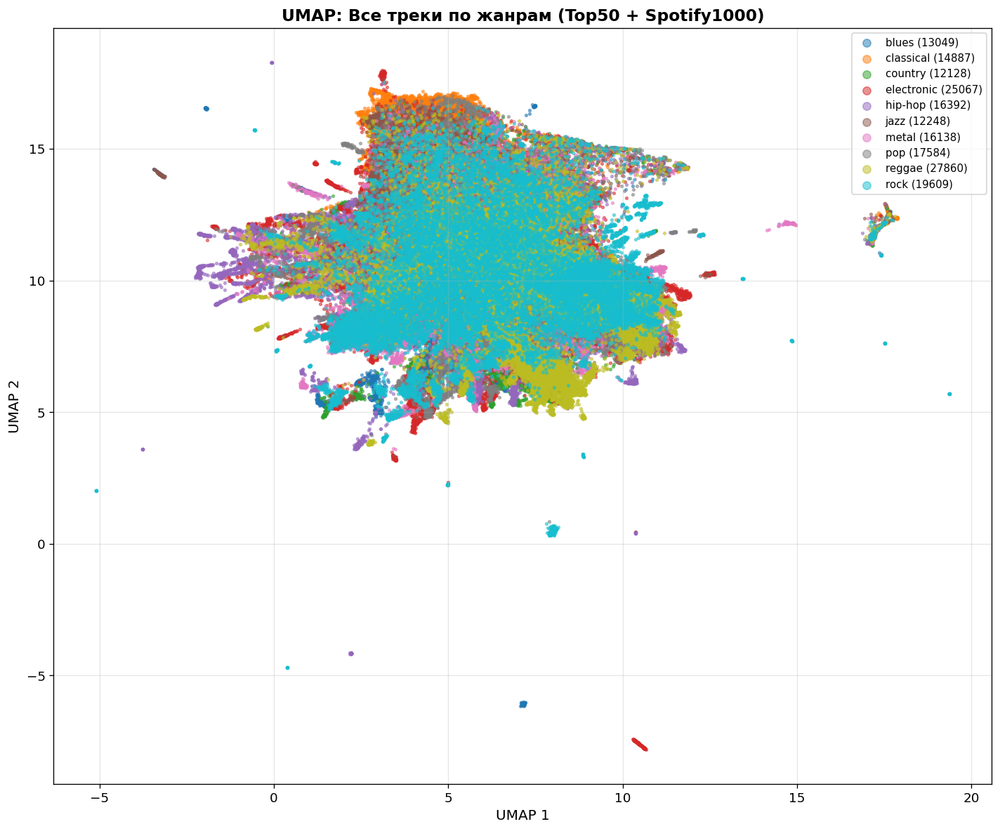

In [ ]:
# 4.1 UMAP по жанрам (все данные)
plot_umap_by_genre(X_umap, genres, "UMAP: Все треки по жанрам (Top50 + Spotify1000)")


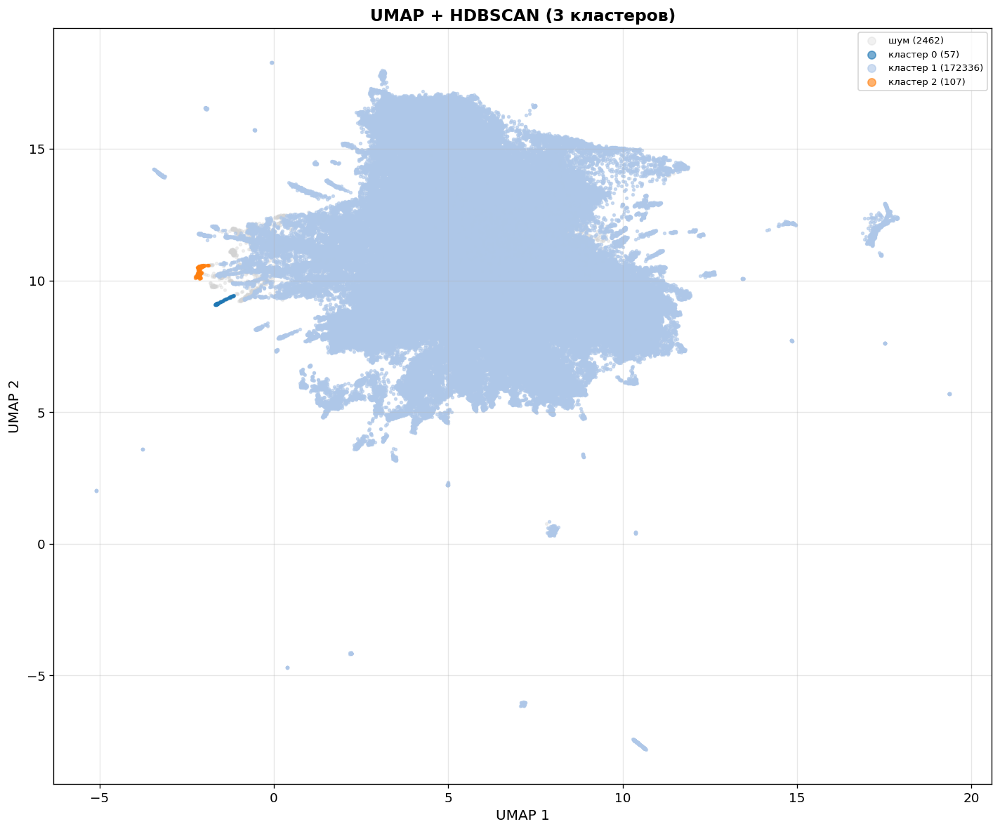

In [ ]:
# 4.2 UMAP с кластерами HDBSCAN
plot_umap_clusters(X_umap, labels_hdbscan, f"UMAP + HDBSCAN ({n_clusters_hdbscan} кластеров)")


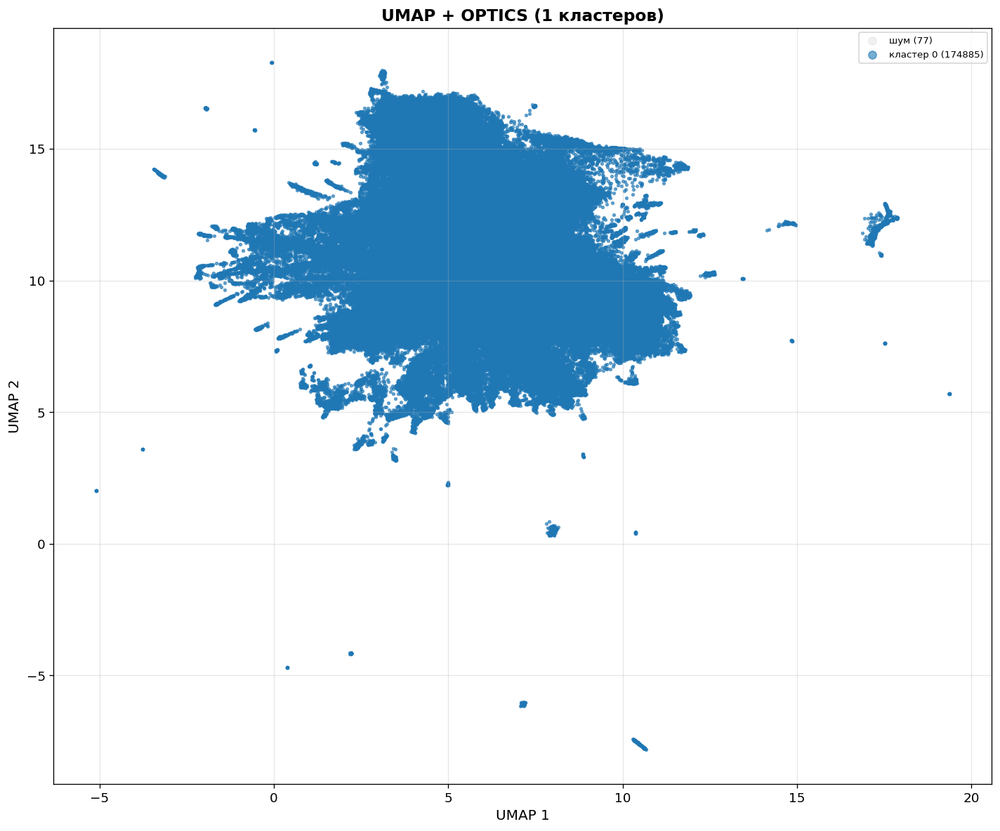

In [ ]:
# 4.3 UMAP с кластерами OPTICS
plot_umap_clusters(X_umap, labels_optics, f"UMAP + OPTICS ({n_clusters_optics} кластеров)")


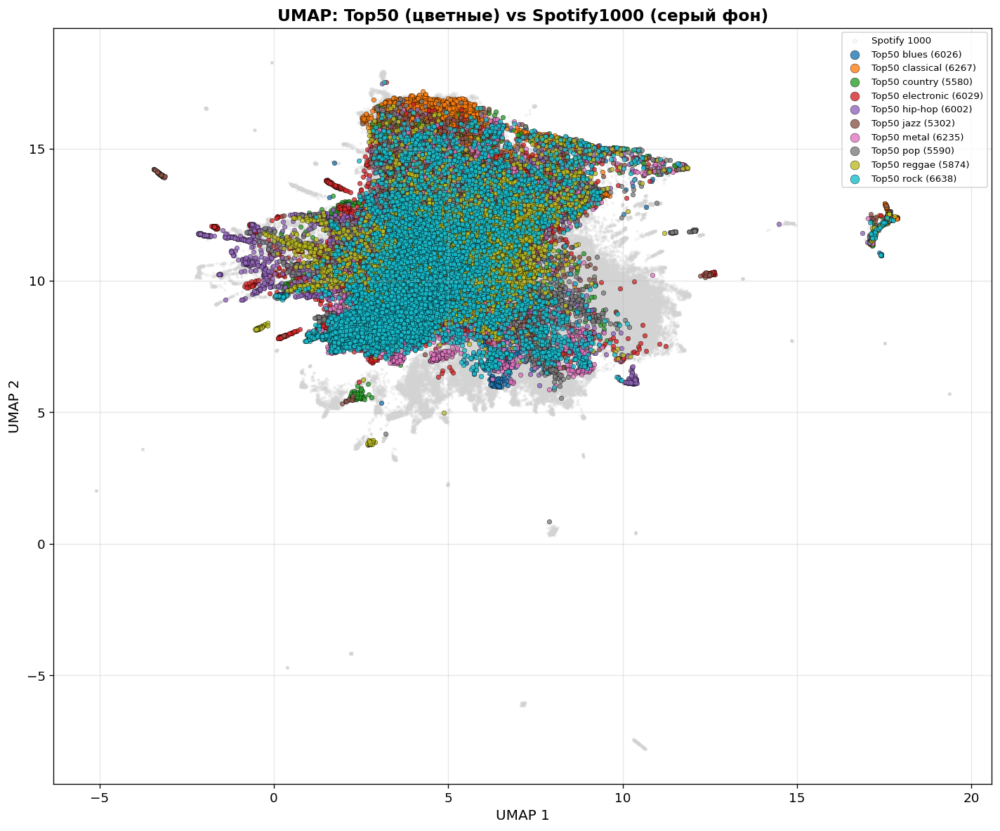

In [ ]:
# 4.4 UMAP с выделением Top50 по жанрам
plot_umap_top50_highlighted(X_umap, genres, sources, "UMAP: Top50 (цветные) vs Spotify1000 (серый фон)")


## 5. Графики по каждому жанру отдельно


In [ ]:
def analyze_single_genre(genre_name, X_scaled_all, X_umap_all, genres_all, sources_all):
    """
    Анализирует один жанр: 
    - UMAP с разделением top50/spotify1000 (популярность)
    - UMAP + HDBSCAN
    - UMAP + OPTICS
    """
    # Фильтруем данные для этого жанра
    genre_mask = genres_all == genre_name
    X_genre = X_scaled_all[genre_mask]
    X_umap_genre = X_umap_all[genre_mask]
    sources_genre = sources_all[genre_mask]
    
    if len(X_genre) == 0:
        print(f"Нет данных для жанра {genre_name}")
        return
    
    print(f"\n{'='*60}")
    print(f"ЖАНР: {genre_name.upper()}")
    print(f"{'='*60}")
    print(f"Всего баров: {len(X_genre)}")
    print(f"  Top50: {np.sum(sources_genre == 'top50')}")
    print(f"  Spotify1000: {np.sum(sources_genre == 'spotify1000')}")
    
    # Кластеризация для этого жанра
    hdbscan_genre = hdbscan.HDBSCAN(min_cluster_size=20, min_samples=5)
    labels_hdbscan_genre = hdbscan_genre.fit_predict(X_genre)
    
    optics_genre = OPTICS(min_samples=5, xi=0.05, min_cluster_size=0.05)
    labels_optics_genre = optics_genre.fit_predict(X_genre)
    
    n_hdbscan = len(set(labels_hdbscan_genre)) - (1 if -1 in labels_hdbscan_genre else 0)
    n_optics = len(set(labels_optics_genre)) - (1 if -1 in labels_optics_genre else 0)
    
    # Создаём фигуру 2x2
    fig, axes = plt.subplots(2, 2, figsize=(16, 14))
    cmap = plt.get_cmap('tab20')
    
    # 1. UMAP: Top50 vs Spotify1000 (популярность)
    ax1 = axes[0, 0]
    mask_1000 = sources_genre == 'spotify1000'
    mask_top50 = sources_genre == 'top50'
    
    ax1.scatter(X_umap_genre[mask_1000, 0], X_umap_genre[mask_1000, 1], 
                s=10, alpha=0.5, color='#3498db', label=f'Spotify1000 ({np.sum(mask_1000)})')
    ax1.scatter(X_umap_genre[mask_top50, 0], X_umap_genre[mask_top50, 1], 
                s=25, alpha=0.8, color='#e74c3c', edgecolors='black', linewidths=0.5,
                label=f'Top50 ({np.sum(mask_top50)})')
    ax1.set_title(f"{genre_name}: Top50 (красные) vs Spotify1000 (синие)", fontweight='bold')
    ax1.legend(fontsize=9); ax1.grid(alpha=0.3)
    
    # 2. Только Top50 и Spotify1000 разными маркерами
    ax2 = axes[0, 1]
    ax2.scatter(X_umap_genre[mask_1000, 0], X_umap_genre[mask_1000, 1], 
                s=8, alpha=0.4, marker='o', color='gray', label='Spotify1000')
    ax2.scatter(X_umap_genre[mask_top50, 0], X_umap_genre[mask_top50, 1], 
                s=40, alpha=0.9, marker='*', color=GENRE_COLORS[genre_name], 
                edgecolors='black', linewidths=0.3, label='Top50')
    ax2.set_title(f"{genre_name}: Популярность (★ = Top50)", fontweight='bold')
    ax2.legend(fontsize=9); ax2.grid(alpha=0.3)
    
    # 3. HDBSCAN кластеры
    ax3 = axes[1, 0]
    for lab in np.unique(labels_hdbscan_genre):
        mask = labels_hdbscan_genre == lab
        color = 'lightgray' if lab == -1 else cmap(lab % 20)
        label = f'шум ({np.sum(mask)})' if lab == -1 else f'кластер {lab} ({np.sum(mask)})'
        ax3.scatter(X_umap_genre[mask, 0], X_umap_genre[mask, 1], 
                    s=5 if lab == -1 else 10, alpha=0.3 if lab == -1 else 0.7, 
                    color=color, label=label)
    ax3.set_title(f"{genre_name}: HDBSCAN ({n_hdbscan} кластеров)", fontweight='bold')
    if len(np.unique(labels_hdbscan_genre)) <= 12: ax3.legend(fontsize=8)
    ax3.grid(alpha=0.3)
    
    # 4. OPTICS кластеры
    ax4 = axes[1, 1]
    for lab in np.unique(labels_optics_genre):
        mask = labels_optics_genre == lab
        color = 'lightgray' if lab == -1 else cmap(lab % 20)
        label = f'шум ({np.sum(mask)})' if lab == -1 else f'кластер {lab} ({np.sum(mask)})'
        ax4.scatter(X_umap_genre[mask, 0], X_umap_genre[mask, 1], 
                    s=5 if lab == -1 else 10, alpha=0.3 if lab == -1 else 0.7, 
                    color=color, label=label)
    ax4.set_title(f"{genre_name}: OPTICS ({n_optics} кластеров)", fontweight='bold')
    if len(np.unique(labels_optics_genre)) <= 12: ax4.legend(fontsize=8)
    ax4.grid(alpha=0.3)
    
    fig.suptitle(f"Анализ жанра: {genre_name.upper()}", fontsize=16, fontweight='bold', y=1.01)
    plt.tight_layout()
    plt.show()



ЖАНР: BLUES
Всего баров: 13049
  Top50: 6026
  Spotify1000: 7023


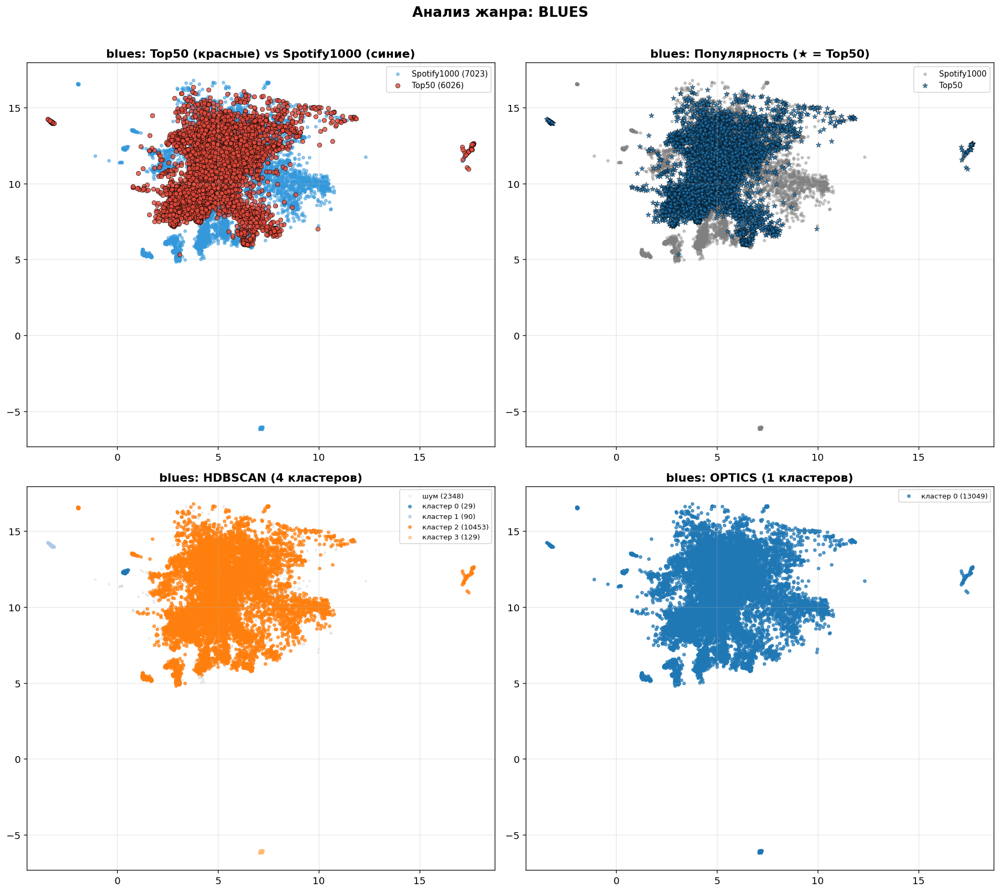


ЖАНР: CLASSICAL
Всего баров: 14887
  Top50: 6267
  Spotify1000: 8620


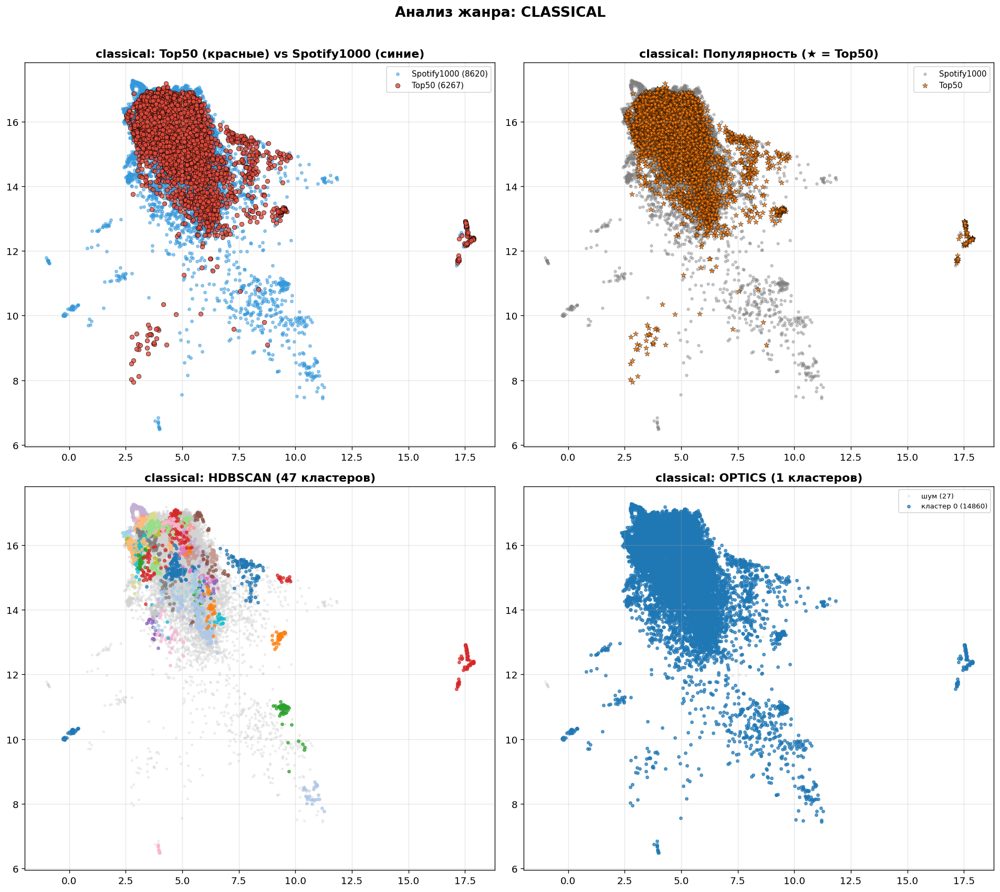


ЖАНР: COUNTRY
Всего баров: 12128
  Top50: 5580
  Spotify1000: 6548


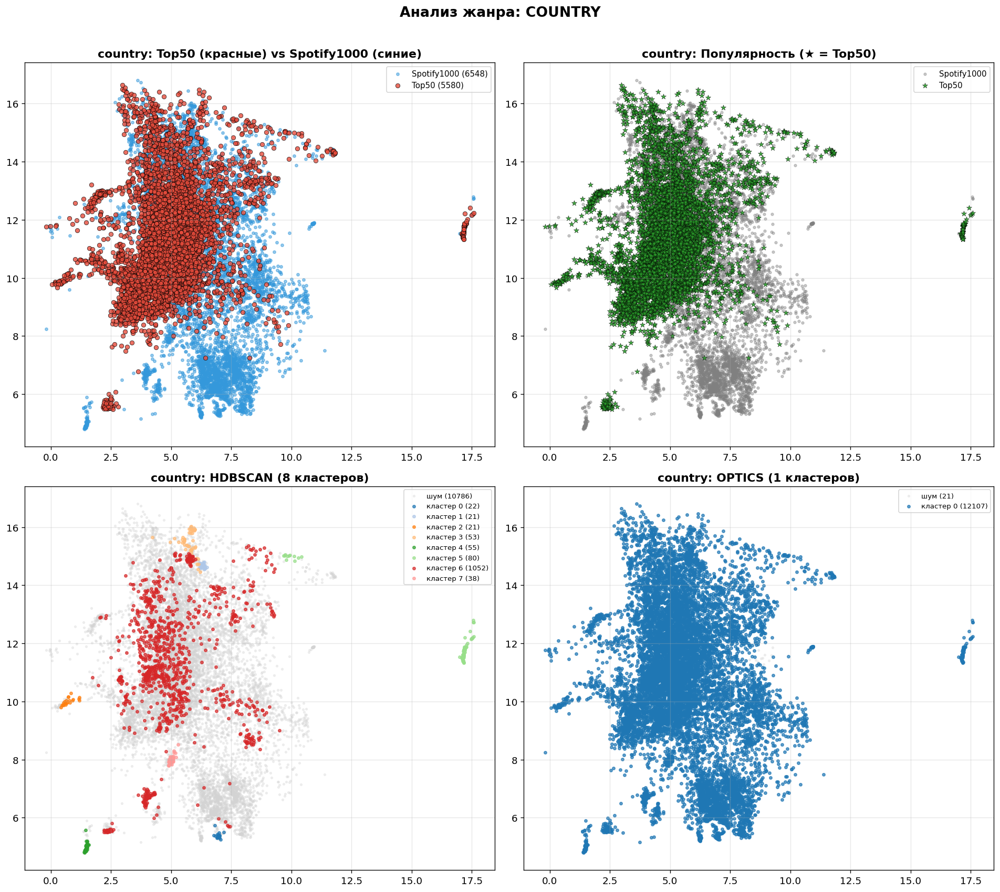


ЖАНР: ELECTRONIC
Всего баров: 25067
  Top50: 6029
  Spotify1000: 19038


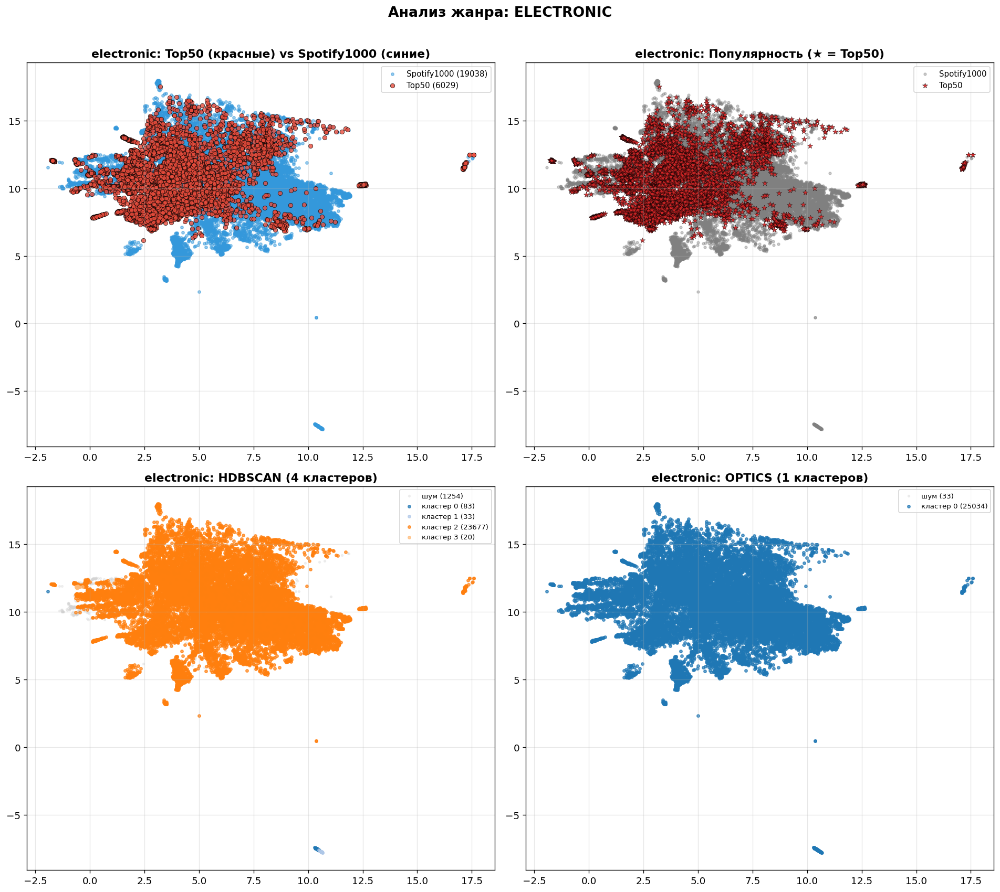


ЖАНР: HIP-HOP
Всего баров: 16392
  Top50: 6002
  Spotify1000: 10390


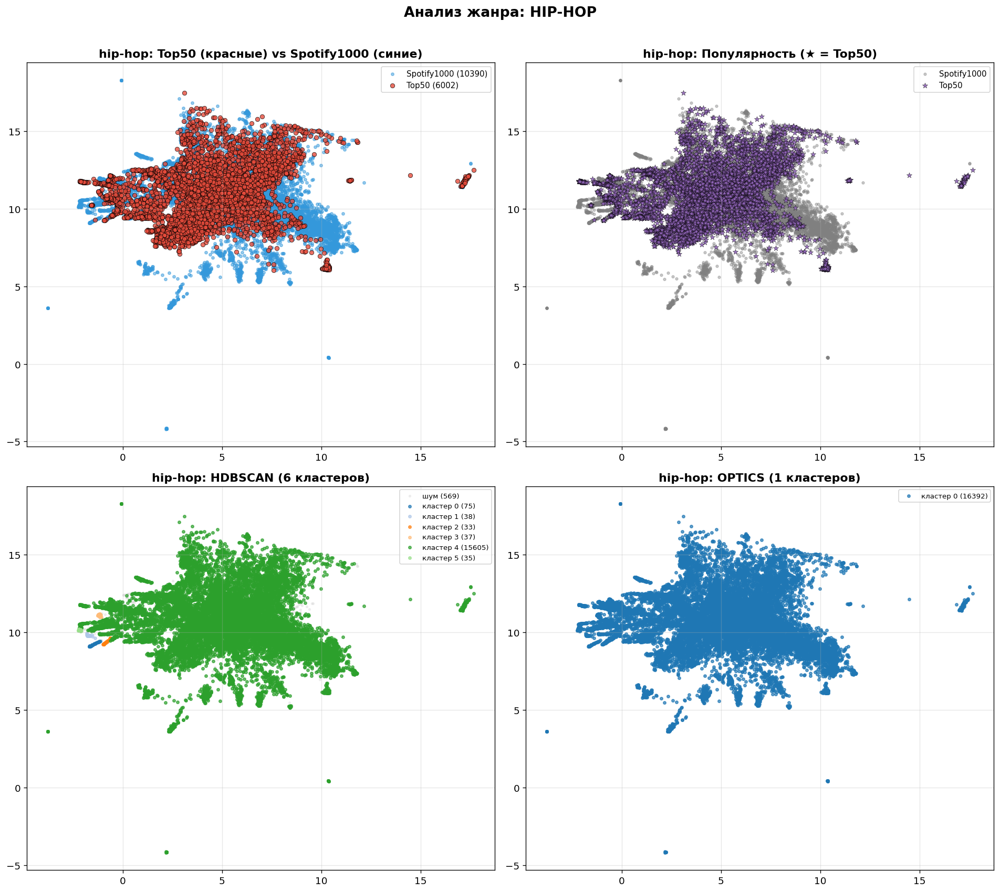


ЖАНР: JAZZ
Всего баров: 12248
  Top50: 5302
  Spotify1000: 6946


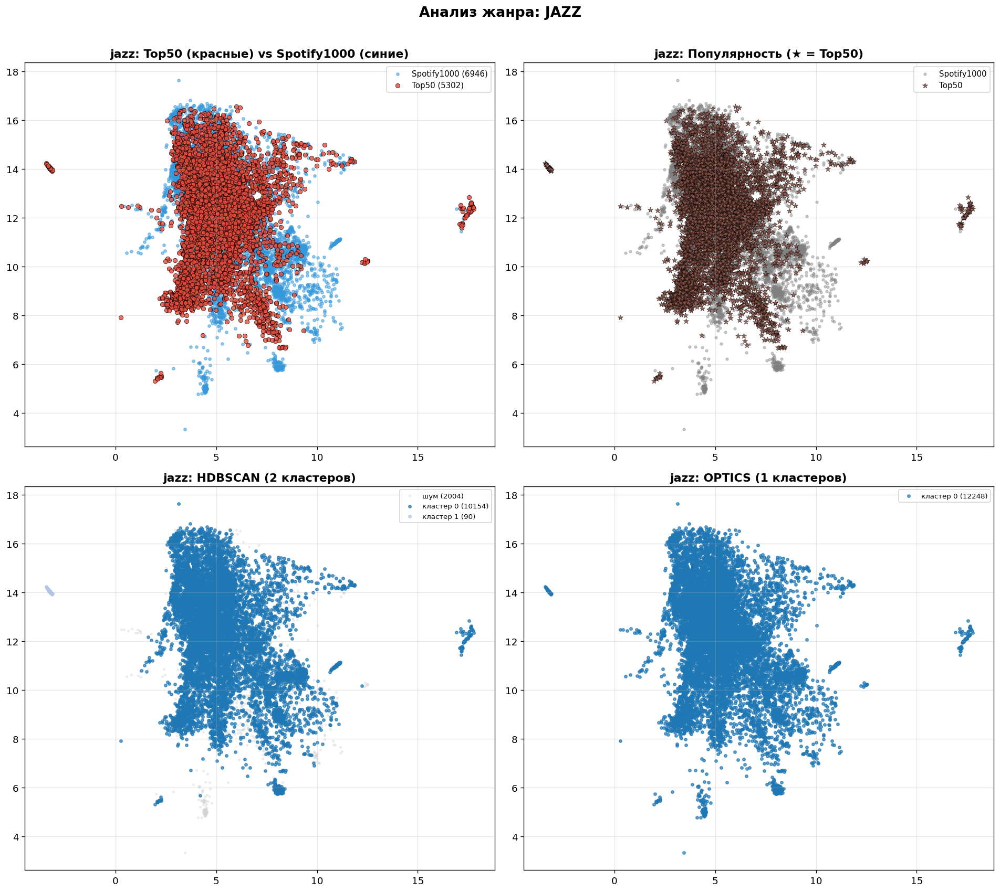


ЖАНР: METAL
Всего баров: 16138
  Top50: 6235
  Spotify1000: 9903


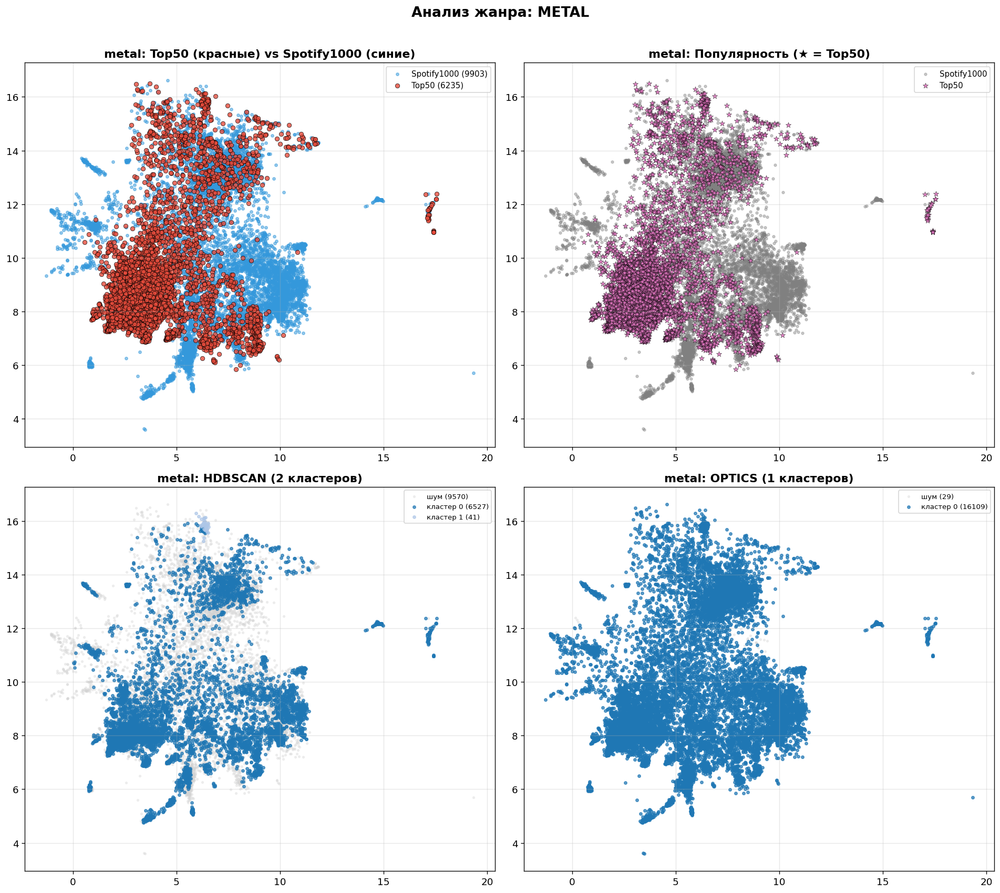


ЖАНР: POP
Всего баров: 17584
  Top50: 5590
  Spotify1000: 11994


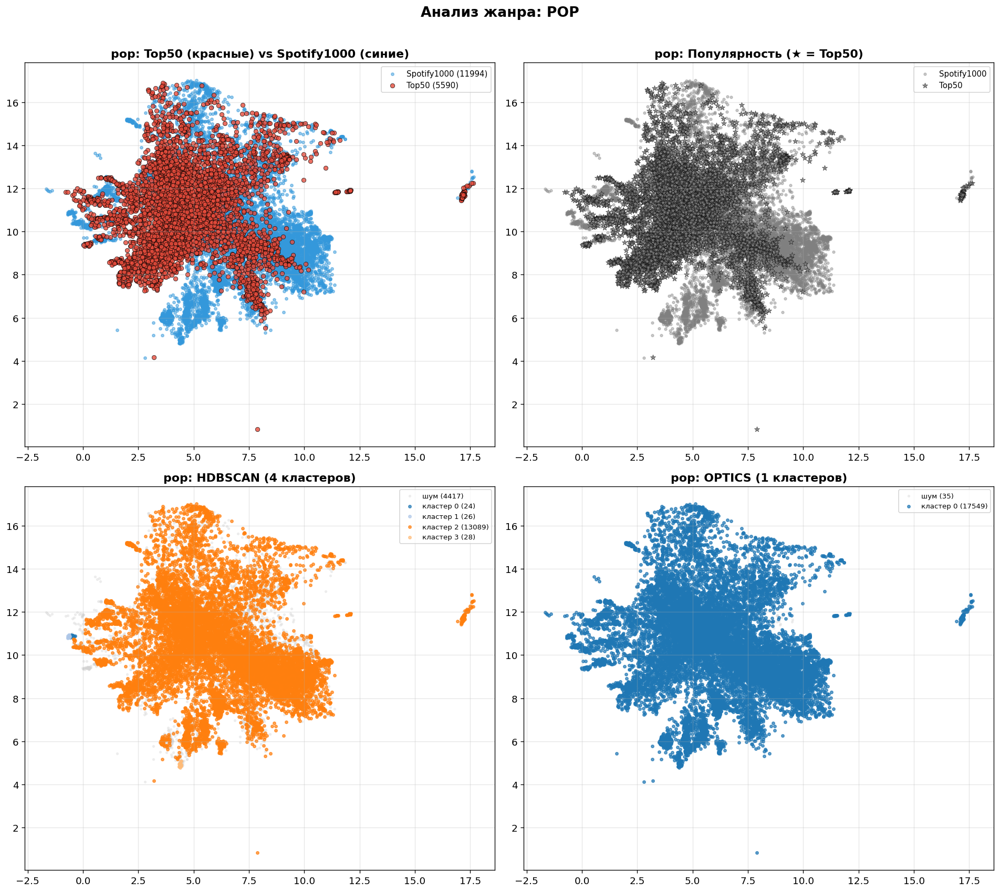


ЖАНР: REGGAE
Всего баров: 27860
  Top50: 5874
  Spotify1000: 21986


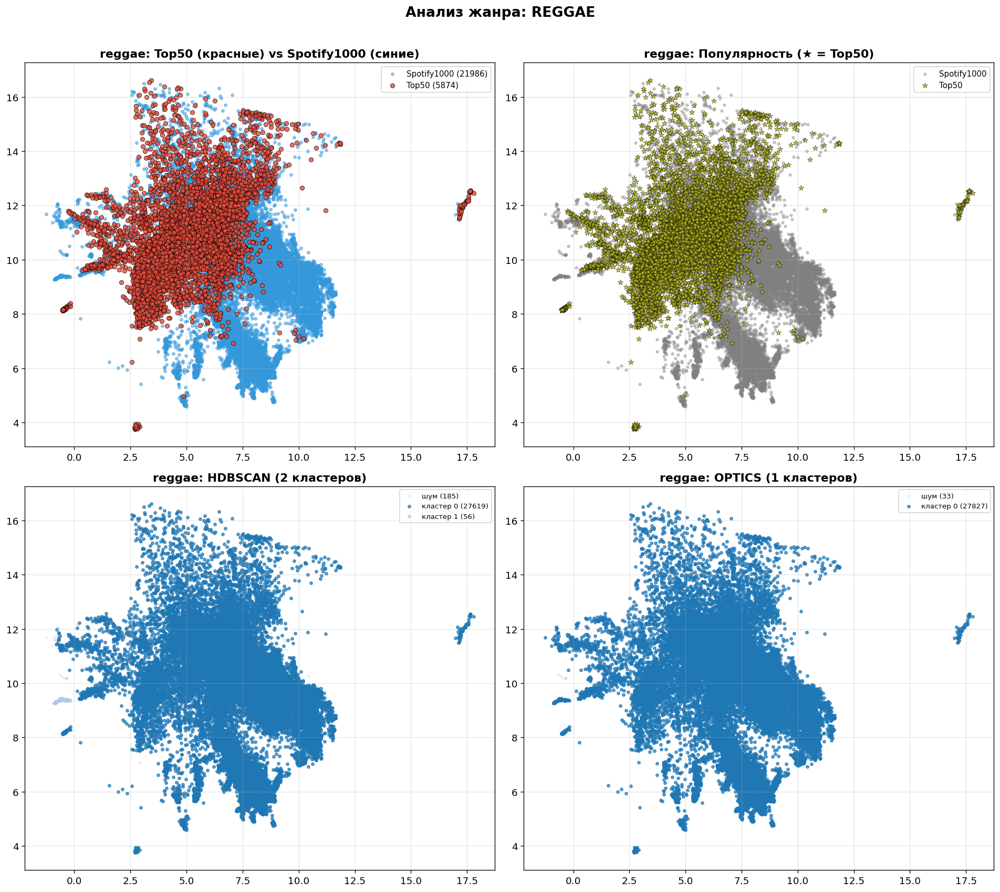


ЖАНР: ROCK
Всего баров: 19609
  Top50: 6638
  Spotify1000: 12971


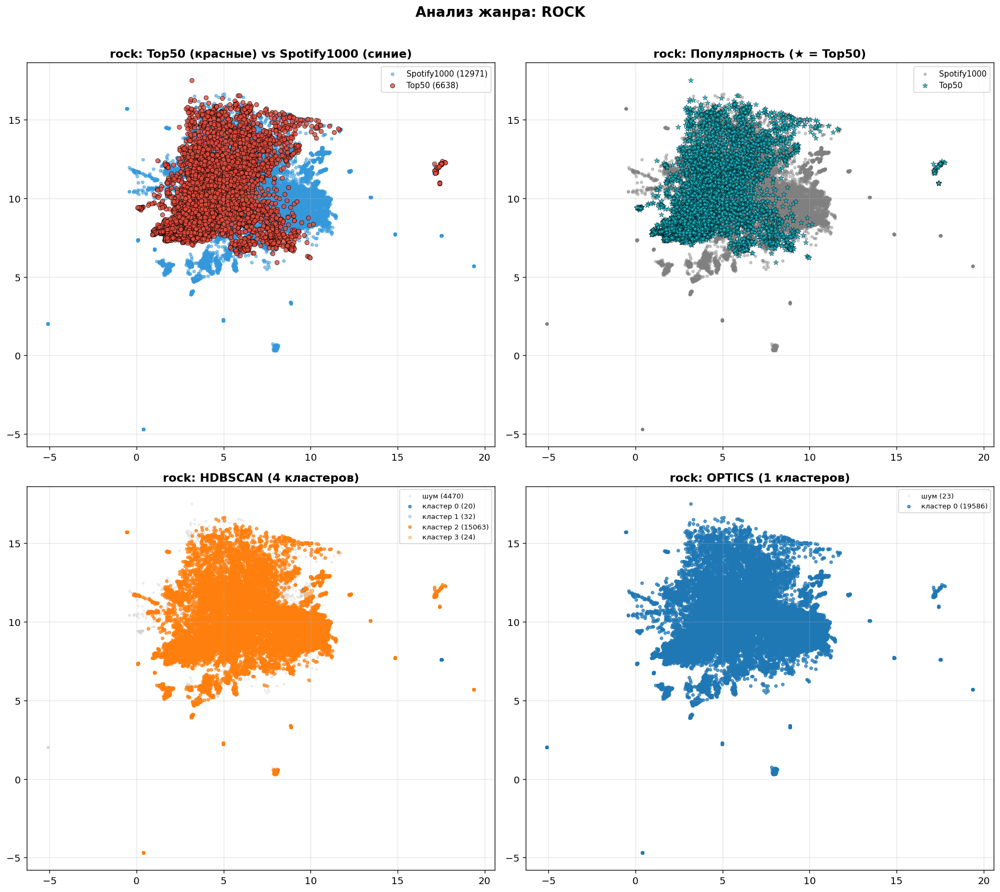

In [ ]:
# Анализ всех жанров по отдельности
for genre in GENRES:
    analyze_single_genre(genre, X_scaled, X_umap, genres, sources)


## 6. Сводная статистика


In [ ]:
# Сводная таблица по жанрам
print("\n" + "="*70)
print("СВОДНАЯ СТАТИСТИКА")
print("="*70)
print(f"{'Жанр':<15} {'Top50':>10} {'Spotify1000':>15} {'Всего':>10}")
print("-"*70)

for genre in GENRES:
    n_top50 = np.sum((genres == genre) & (sources == 'top50'))
    n_1000 = np.sum((genres == genre) & (sources == 'spotify1000'))
    n_total = np.sum(genres == genre)
    print(f"{genre:<15} {n_top50:>10} {n_1000:>15} {n_total:>10}")

print("-"*70)
print(f"{'ИТОГО':<15} {np.sum(sources == 'top50'):>10} {np.sum(sources == 'spotify1000'):>15} {len(sources):>10}")
print("="*70)

print(f"\nКластеризация (на всех данных):")
print(f"  HDBSCAN: {n_clusters_hdbscan} кластеров, {n_noise_hdbscan} шум ({100*n_noise_hdbscan/len(labels_hdbscan):.1f}%)")
print(f"  OPTICS: {n_clusters_optics} кластеров, {n_noise_optics} шум ({100*n_noise_optics/len(labels_optics):.1f}%)")



СВОДНАЯ СТАТИСТИКА
Жанр                 Top50     Spotify1000      Всего
----------------------------------------------------------------------
blues                 6026            7023      13049
classical             6267            8620      14887
country               5580            6548      12128
electronic            6029           19038      25067
hip-hop               6002           10390      16392
jazz                  5302            6946      12248
metal                 6235            9903      16138
pop                   5590           11994      17584
reggae                5874           21986      27860
rock                  6638           12971      19609
----------------------------------------------------------------------
ИТОГО                59543          115419     174962

Кластеризация (на всех данных):
  HDBSCAN: 3 кластеров, 2462 шум (1.4%)
  OPTICS: 1 кластеров, 77 шум (0.0%)
